In [513]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt

from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import Normalizer, MinMaxScaler, StandardScaler
from sklearn.metrics import r2_score, mean_squared_error,pairwise
from sklearn.linear_model import Ridge, LinearRegression, MultiTaskLasso, Lasso
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

import nltk
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer

import folium
import branca

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

%matplotlib inline

In [625]:
from geopandas import GeoDataFrame
from shapely.geometry import Point
import geopandas as gpd
df= pd.read_csv("data/listings.csv")

df.dropna(subset=['neighbourhood_group_cleansed'],inplace=True)
df['price'] = df['price'].apply(lambda c: re.sub('[^a-zA-Z0-9]','',c).strip(' ')).astype('int')
df['mean_']=df.groupby('neighbourhood_group_cleansed')['price'].transform(lambda r : r.mean())


In [515]:
df.loc[(df.neighbourhood=='Queen Anne') & (df.bedrooms==3) & (df.bathrooms==3.5) & (df.room_type=='Entire home/apt'),:].price

239    74900
Name: price, dtype: int64

In [626]:
seattle_map = folium.Map(
    location = [47.6062, -122.3321],
    tiles = 'CartoDB positron',
    zoom_start =11
)

In [628]:
colorscale = branca.colormap.linear.Reds_08.scale(0, 20000)

for i in range(len(df)):
    
    folium.CircleMarker(
        location = [df.latitude.iloc[i], df.longitude.iloc[i]],
        radius = 1,
        popup = df.mean_.iloc[i],
        color = colorscale(df.mean_.iloc[i]),
        fill=False).add_to(seattle_map) 

folium.LayerControl().add_to(seattle_map)    
seattle_map

In [518]:
seattle_map.save('map.html')

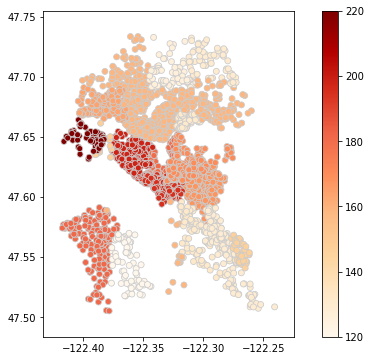

In [519]:
df= pd.read_csv("data/listings.csv")
df.dropna(subset=['neighbourhood_group_cleansed'],inplace=True)
geometry = [Point(xy) for xy in zip(df.longitude, df.latitude)]

df = df.drop(columns=['latitude', 'longitude'], axis=1)
df['price'] = df['price'].apply(lambda c: re.sub('[^a-zA-Z0-9]','',c).strip(' ')).astype('int')
df['mean_']=df.groupby('neighbourhood_group_cleansed')['price'].transform(lambda r : r.mean())
crs = {'init': 'epsg:4326'}
gdf = GeoDataFrame(df, crs=crs, geometry=geometry)
fig, ax = plt.subplots(1, figsize=(10, 6))
vmin, vmax = 120, 220
# Create colorbar as a legend
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# empty array for the data range
sm._A = []
# add the colorbar to the figure
cbar = fig.colorbar(sm)
gdf.plot(column='mean_', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8')

## EXPLORATION

In [520]:
listings = pd.read_csv("data/listings.csv")

In [521]:
listings.groupby('neighbourhood_group_cleansed').neighborhood_overview.apply(lambda val: val.isna().sum())

neighbourhood_group_cleansed
Ballard                 51
Beacon Hill             36
Capitol Hill           171
Cascade                 33
Central Area            93
Delridge                15
Downtown               187
Interbay                 1
Lake City               20
Magnolia                16
Northgate               22
Other neighborhoods    177
Queen Anne              82
Rainier Valley          36
Seward Park              6
University District     33
West Seattle            53
Name: neighborhood_overview, dtype: int64

In [522]:
listings.head(n=1)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,241032,https://www.airbnb.com/rooms/241032,20160104002432,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,NaN,NaN,https://a1.muscache.com/ac/pictures/67560560/c...,NaN,956883,https://www.airbnb.com/users/show/956883,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,https://a0.muscache.com/ac/users/956883/profil...,https://a0.muscache.com/ac/users/956883/profil...,Queen Anne,3.0,3.0,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,47.636289,-122.371025,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",NaN,$85.00,NaN,NaN,NaN,NaN,2,$5.00,1,365,4 weeks ago,t,14,41,71,346,2016-01-04,207,2011-11-01,2016-01-02,95.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,WASHINGTON,f,moderate,f,f,2,4.07


In [523]:
listings.calendar_last_scraped.nunique()

1

**Initial investigation shows that we can remove:**
'name', 'host_name', 'host_about','host_neighbourhood'host_listings_count	host_total_listings_count	host_verifications	host_has_profile_pic	host_identity_verified'
'scrape_id', 'last_scraped', 'calendar_last_scraped', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_url', 'host_thumbnail_url', 'host_picture_url'


In [524]:
listings.drop(columns=['id', 'scrape_id', 'calendar_last_scraped', 'listing_url', 'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url', 'host_url', 'host_thumbnail_url', 'host_picture_url'], axis=1, inplace=True)

In [525]:
numeric_columns = listings.select_dtypes(include=[np.number]).columns.tolist()
print('|\t'.join(numeric_columns))

host_id|	host_listings_count|	host_total_listings_count|	latitude|	longitude|	accommodates|	bathrooms|	bedrooms|	beds|	square_feet|	guests_included|	minimum_nights|	maximum_nights|	availability_30|	availability_60|	availability_90|	availability_365|	number_of_reviews|	review_scores_rating|	review_scores_accuracy|	review_scores_cleanliness|	review_scores_checkin|	review_scores_communication|	review_scores_location|	review_scores_value|	license|	calculated_host_listings_count|	reviews_per_month


In [526]:
listings[numeric_columns].head()

,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,square_feet,guests_included,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,calculated_host_listings_count,reviews_per_month
0,956883,3.0,3.0,47.636289,-122.371025,4,1.0,1.0,1.0,NaN,2,1,365,14,41,71,346,207,95.0,10.0,10.0,10.0,10.0,9.0,10.0,NaN,2,4.07
1,5177328,6.0,6.0,47.639123,-122.365666,4,1.0,1.0,1.0,NaN,1,2,90,13,13,16,291,43,96.0,10.0,10.0,10.0,10.0,10.0,10.0,NaN,6,1.48
2,16708587,2.0,2.0,47.629724,-122.369483,11,4.5,5.0,7.0,NaN,10,4,30,1,6,17,220,20,97.0,10.0,10.0,10.0,10.0,10.0,10.0,NaN,2,1.15
3,9851441,1.0,1.0,47.638473,-122.369279,3,1.0,0.0,2.0,NaN,1,1,1125,0,0,0,143,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN
4,1452570,2.0,2.0,47.632918,-122.372471,6,2.0,3.0,3.0,NaN,6,1,1125,30,60,90,365,38,92.0,9.0,9.0,10.0,10.0,9.0,9.0,NaN,1,0.89


**From numeric columns we can drop square_feet and license due to the large proportion of null values.**

In [528]:
listings.drop(columns=['square_feet', 'license'], axis=1, inplace=True)
numeric_columns.remove('square_feet')
numeric_columns.remove('license')

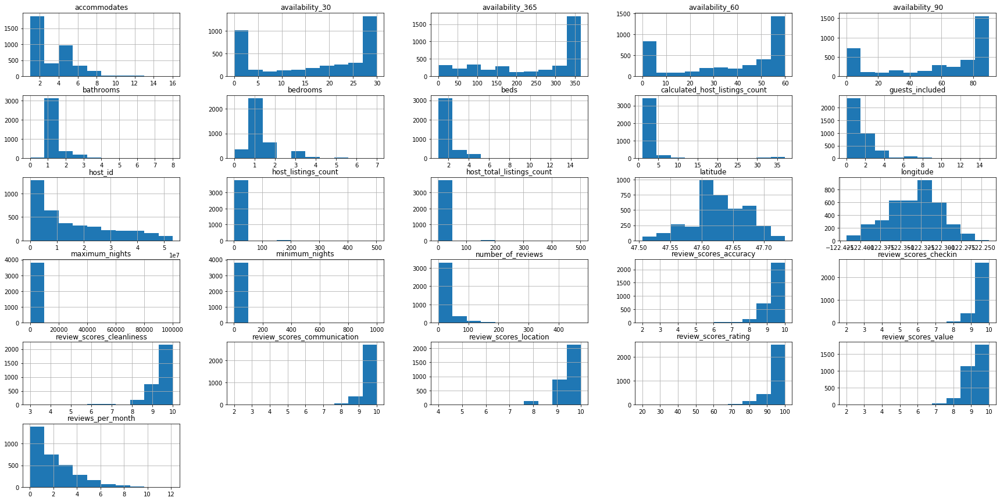

In [529]:
fig = plt.figure(figsize=(30,15))
ax = fig.gca()

vals = listings[numeric_columns].hist(ax=ax)

In [530]:
listings[(listings.host_listings_count==listings.host_total_listings_count) | (listings.host_listings_count.isna()&listings.host_total_listings_count.isna())].shape

(3818, 79)

**host_listings_count can be dropped**

In [531]:
listings.drop('host_listings_count', axis=1, inplace=True)

In [532]:
numeric_columns.remove('host_listings_count')

In [533]:
non_skewed = ['latitude', 'longitude', 'availability_30','availability_60', 'availability_90', 'availability_365']

In [534]:
for col in non_skewed:
    numeric_columns.remove(col)

**Investigate Categorical Columns**

In [539]:
 # except date columns cleanse the strings
cat_columns = listings.select_dtypes(exclude=[np.number]).columns.tolist()
print(' | '.join(cat_columns))

last_scraped | name | summary | space | description | experiences_offered | neighborhood_overview | notes | transit | host_name | host_since | host_location | host_about | host_response_time | host_response_rate | host_acceptance_rate | host_is_superhost | host_neighbourhood | host_verifications | host_has_profile_pic | host_identity_verified | street | neighbourhood | neighbourhood_cleansed | neighbourhood_group_cleansed | city | state | zipcode | market | smart_location | country_code | country | is_location_exact | property_type | room_type | bed_type | amenities | price | weekly_price | monthly_price | security_deposit | cleaning_fee | extra_people | calendar_updated | has_availability | first_review | last_review | requires_license | jurisdiction_names | instant_bookable | cancellation_policy | require_guest_profile_picture | require_guest_phone_verification


In [540]:
listings[cat_columns].head(n=1)

,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,is_location_exact,property_type,room_type,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,extra_people,calendar_updated,has_availability,first_review,last_review,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,2016-01-04,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,Maija,2011-08-11,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,Queen Anne,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,t,Apartment,Entire home/apt,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",$85.00,NaN,NaN,NaN,NaN,$5.00,4 weeks ago,t,2011-11-01,2016-01-02,f,WASHINGTON,f,moderate,f,f


In [541]:
date_columns = ['first_review', 'last_review', 'host_since', 'last_scraped']

In [542]:
for col in date_columns:
    listings[col] = pd.to_datetime(listings[col])

In [543]:
listings['time_to_first_review'] = listings['first_review'] - listings['host_since']

In [544]:
listings['time_since_last_review'] = listings['last_scraped'] - listings['last_review']

In [545]:
listings.drop(date_columns, axis=1, inplace=True)

In [546]:
for col in date_columns:
    cat_columns.remove(col)

In [547]:
listings[cat_columns].head(n=1)

,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,host_name,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_neighbourhood,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,is_location_exact,property_type,room_type,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,extra_people,calendar_updated,has_availability,requires_license,jurisdiction_names,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,Stylish Queen Anne Apartment,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,none,NaN,NaN,NaN,Maija,"Seattle, Washington, United States","I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,Queen Anne,"['email', 'phone', 'reviews', 'kba']",t,t,"Gilman Dr W, Seattle, WA 98119, United States",Queen Anne,West Queen Anne,Queen Anne,Seattle,WA,98119,Seattle,"Seattle, WA",US,United States,t,Apartment,Entire home/apt,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",$85.00,NaN,NaN,NaN,NaN,$5.00,4 weeks ago,t,f,WASHINGTON,f,moderate,f,f


In [548]:
unique_cat_counts  = listings[cat_columns].apply(lambda c : c.nunique()==1)

In [549]:
non_unique_columns = unique_cat_counts[unique_cat_counts==True].keys().tolist()

In [550]:
non_unique_columns

['experiences_offered',
 'market',
 'country_code',
 'country',
 'has_availability',
 'requires_license',
 'jurisdiction_names']

In [551]:
listings.drop(non_unique_columns, axis=1, inplace=True)

In [552]:
for col in non_unique_columns:
    cat_columns.remove(col)

In [553]:
# listings[cat_columns].head(n=2)

In [554]:
# id and name
def isOneToOne(df, col1, col2):
    first = df.groupby(col1)[col2].count().max()
    second = df.groupby(col2)[col1].count().max()
    return first + second == 2
isOneToOne(listings, 'description', 'name')

False

In [555]:
listings.groupby('description')['name']\
  .apply(lambda x: x.nunique() == 1)\
  .all()

False

In [556]:
cat_columns

['name',
 'summary',
 'space',
 'description',
 'neighborhood_overview',
 'notes',
 'transit',
 'host_name',
 'host_location',
 'host_about',
 'host_response_time',
 'host_response_rate',
 'host_acceptance_rate',
 'host_is_superhost',
 'host_neighbourhood',
 'host_verifications',
 'host_has_profile_pic',
 'host_identity_verified',
 'street',
 'neighbourhood',
 'neighbourhood_cleansed',
 'neighbourhood_group_cleansed',
 'city',
 'state',
 'zipcode',
 'smart_location',
 'is_location_exact',
 'property_type',
 'room_type',
 'bed_type',
 'amenities',
 'price',
 'weekly_price',
 'monthly_price',
 'security_deposit',
 'cleaning_fee',
 'extra_people',
 'calendar_updated',
 'instant_bookable',
 'cancellation_policy',
 'require_guest_profile_picture',
 'require_guest_phone_verification']

In [557]:
high_dim_columns=['calendar_updated', 'neighborhood_overview','name','host_name', 'host_neighbourhood', 'host_location','host_verifications', 'neighbourhood', 'neighbourhood_cleansed','street','city', 'state','zipcode','smart_location']
listings.drop(columns=high_dim_columns, axis=1, inplace=True)

In [558]:
for col in high_dim_columns:
    cat_columns.remove(col)

In [559]:
listings[cat_columns].head(n=2)

,summary,space,description,notes,transit,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,is_location_exact,property_type,room_type,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,extra_people,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,NaN,Make your self at home in this charming one-be...,Make your self at home in this charming one-be...,NaN,NaN,"I am an artist, interior designer, and run a s...",within a few hours,96%,100%,f,t,t,Queen Anne,t,Apartment,Entire home/apt,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",$85.00,NaN,NaN,NaN,NaN,$5.00,f,moderate,f,f
1,Chemically sensitive? We've removed the irrita...,"Beautiful, hypoallergenic apartment in an extr...",Chemically sensitive? We've removed the irrita...,What's up with the free pillows? Our home was...,"Convenient bus stops are just down the block, ...",Living east coast/left coast/overseas. Time i...,within an hour,98%,100%,t,t,t,Queen Anne,t,Apartment,Entire home/apt,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",$150.00,"$1,000.00","$3,000.00",$100.00,$40.00,$0.00,f,strict,t,t


In [560]:
# listings[['summary','space','description','notes']].head()

In [561]:
listings.description.nunique()

3742

In [562]:
redundant_cols = ['summary', 'space', 'notes','host_about']
listings.drop(columns=redundant_cols, axis=1, inplace=True)
for col in redundant_cols:
    cat_columns.remove(col)

In [563]:
listings[cat_columns].head(n=2)

,description,transit,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,is_location_exact,property_type,room_type,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,extra_people,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,Make your self at home in this charming one-be...,NaN,within a few hours,96%,100%,f,t,t,Queen Anne,t,Apartment,Entire home/apt,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",$85.00,NaN,NaN,NaN,NaN,$5.00,f,moderate,f,f
1,Chemically sensitive? We've removed the irrita...,"Convenient bus stops are just down the block, ...",within an hour,98%,100%,t,t,t,Queen Anne,t,Apartment,Entire home/apt,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",$150.00,"$1,000.00","$3,000.00",$100.00,$40.00,$0.00,f,strict,t,t


In [564]:
# as we have no NaN in description remove summary,space, notes

last_scraped - host_since length of host
last scraped - last review latest review happened when
first_review - host_since first review happened when

In [565]:
# remove % from rates
rate_columns = ['host_response_rate', 'host_acceptance_rate']

**In fact the following fields can be numerical as they represent boolean values or have currency sign etc. in them.**

monetary = 'price', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'extra_people'

boolean = 'host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'is_location_exact', 'has_availability', 'requires_license','instant_bookable','require_guest_profile_picture','require_guest_phone_verification'

In [566]:
monetary = ['price', 'weekly_price', 'monthly_price', 'security_deposit', 'cleaning_fee', 'extra_people']
boolean = ['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified', 'is_location_exact', 'instant_bookable','require_guest_profile_picture','require_guest_phone_verification']

In [567]:
for col in monetary+rate_columns:
    listings[col] = listings[col].apply(lambda val: re.sub(r'[^a-zA-Z0-9]', '', str(val)) if val is not np.nan else 0).astype('int')

In [568]:
for col in boolean:
    listings[col] = listings[col].apply(lambda val: 1 if val=='t' else 0)

In [569]:
for col in monetary+rate_columns+boolean:
    cat_columns.remove(col)

In [570]:
listings[cat_columns].head(n=2)

,description,transit,host_response_time,neighbourhood_group_cleansed,property_type,room_type,bed_type,amenities,cancellation_policy
0,Make your self at home in this charming one-be...,NaN,within a few hours,Queen Anne,Apartment,Entire home/apt,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",moderate
1,Chemically sensitive? We've removed the irrita...,"Convenient bus stops are just down the block, ...",within an hour,Queen Anne,Apartment,Entire home/apt,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",strict


In [571]:
cat_columns.remove('amenities')
for col in cat_columns:
    listings[col] = listings[col].apply(lambda val: re.sub('[^a-zA-Z0-9]', ' ', str(val)).strip(' '))

In [572]:
listings.time_to_first_review = listings.time_to_first_review.dt.days

In [573]:
listings.time_since_last_review = listings.time_since_last_review.dt.days

In [574]:
listings.head(n=2)

,description,transit,host_id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,time_to_first_review,time_since_last_review
0,Make your self at home in this charming one be...,nan,956883,within a few hours,96,100,0,3.0,1,1,Queen Anne,47.636289,-122.371025,1,Apartment,Entire home apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,""Wireless Internet"",""A...",8500,0,0,0,0,2,500,1,365,14,41,71,346,207,95.0,10.0,10.0,10.0,10.0,9.0,10.0,0,moderate,0,0,2,4.07,82.0,2.0
1,Chemically sensitive We ve removed the irrita...,Convenient bus stops are just down the block ...,5177328,within an hour,98,100,1,6.0,1,1,Queen Anne,47.639123,-122.365666,1,Apartment,Entire home apt,4,1.0,1.0,1.0,Real Bed,"{TV,Internet,""Wireless Internet"",Kitchen,""Free...",15000,100000,300000,10000,4000,1,0,2,90,13,13,16,291,43,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict,1,1,6,1.48,179.0,6.0


In [575]:
# Cleanse amenities
listings =pd.concat([listings.drop('amenities',axis=1), listings.amenities.apply(lambda val: re.sub('[^a-zA-Z0-9\,]',' ', val).replace(' ','').split(',')).str.join('|').str.get_dummies()],axis=1)

In [576]:
listings.head(n=2)

,description,transit,host_id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,time_to_first_review,time_since_last_review,24HourCheckin,AirConditioning,Breakfast,BuzzerWirelessIntercom,CableTV,CarbonMonoxideDetector,Cats,Dogs,Doorman,Dryer,ElevatorinBuilding,Essentials,FamilyKidFriendly,FireExtinguisher,FirstAidKit,FreeParkingonPremises,Gym,HairDryer,Hangers,Heating,HotTub,IndoorFireplace,Internet,Iron,Kitchen,LaptopFriendlyWorkspace,LockonBedroomDoor,Otherpets,PetsAllowed,Petsliveonthisproperty,Pool,SafetyCard,Shampoo,SmokeDetector,SmokingAllowed,SuitableforEvents,TV,Washer,WasherDryer,WheelchairAccessible,WirelessInternet
0,Make your self at home in this charming one be...,nan,956883,within a few hours,96,100,0,3.0,1,1,Queen Anne,47.636289,-122.371025,1,Apartment,Entire home apt,4,1.0,1.0,1.0,Real Bed,8500,0,0,0,0,2,500,1,365,14,41,71,346,207,95.0,10.0,10.0,10.0,10.0,9.0,10.0,0,moderate,0,0,2,4.07,82.0,2.0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1
1,Chemically sensitive We ve removed the irrita...,Convenient bus stops are just down the block ...,5177328,within an hour,98,100,1,6.0,1,1,Queen Anne,47.639123,-122.365666,1,Apartment,Entire home apt,4,1.0,1.0,1.0,Real Bed,15000,100000,300000,10000,4000,1,0,2,90,13,13,16,291,43,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict,1,1,6,1.48,179.0,6.0,0,0,0,1,0,1,0,0,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,1


In [577]:
from textblob import TextBlob
listings['description_polarity'] = listings['description'].apply(lambda val :  TextBlob(val).sentiment.polarity)

In [578]:
listings['transit_polarity'] = listings['transit'].apply(lambda val :  TextBlob(val).sentiment.polarity)

In [579]:
listings.drop(columns=['description','transit'], axis=1, inplace=True)

In [580]:
listings.head(n=2)

,host_id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood_group_cleansed,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,time_to_first_review,time_since_last_review,24HourCheckin,AirConditioning,Breakfast,BuzzerWirelessIntercom,CableTV,CarbonMonoxideDetector,Cats,Dogs,Doorman,Dryer,ElevatorinBuilding,Essentials,FamilyKidFriendly,FireExtinguisher,FirstAidKit,FreeParkingonPremises,Gym,HairDryer,Hangers,Heating,HotTub,IndoorFireplace,Internet,Iron,Kitchen,LaptopFriendlyWorkspace,LockonBedroomDoor,Otherpets,PetsAllowed,Petsliveonthisproperty,Pool,SafetyCard,Shampoo,SmokeDetector,SmokingAllowed,SuitableforEvents,TV,Washer,WasherDryer,WheelchairAccessible,WirelessInternet,description_polarity,transit_polarity
0,956883,within a few hours,96,100,0,3.0,1,1,Queen Anne,47.636289,-122.371025,1,Apartment,Entire home apt,4,1.0,1.0,1.0,Real Bed,8500,0,0,0,0,2,500,1,365,14,41,71,346,207,95.0,10.0,10.0,10.0,10.0,9.0,10.0,0,moderate,0,0,2,4.07,82.0,2.0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0.232982,0.000000
1,5177328,within an hour,98,100,1,6.0,1,1,Queen Anne,47.639123,-122.365666,1,Apartment,Entire home apt,4,1.0,1.0,1.0,Real Bed,15000,100000,300000,10000,4000,1,0,2,90,13,13,16,291,43,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,strict,1,1,6,1.48,179.0,6.0,0,0,0,1,0,1,0,0,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0.312738,-0.077778


In [581]:
obj_columns = listings.select_dtypes(exclude=[np.number]).columns.tolist()

In [582]:
obj_columns

['host_response_time',
 'neighbourhood_group_cleansed',
 'property_type',
 'room_type',
 'bed_type',
 'cancellation_policy']

In [583]:
for col in obj_columns:
    listings[col] = listings[col].apply(lambda val: np.nan if val=='nan' else val)
    listings = pd.concat([listings.drop(col, axis=1), pd.get_dummies(listings[col], dummy_na=False ,drop_first=True)],axis=1)

In [584]:
listings.head()

,host_id,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,accommodates,bathrooms,bedrooms,beds,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,time_to_first_review,time_since_last_review,24HourCheckin,AirConditioning,Breakfast,BuzzerWirelessIntercom,CableTV,CarbonMonoxideDetector,Cats,Dogs,Doorman,Dryer,ElevatorinBuilding,Essentials,FamilyKidFriendly,FireExtinguisher,FirstAidKit,FreeParkingonPremises,Gym,HairDryer,Hangers,Heating,HotTub,IndoorFireplace,Internet,Iron,Kitchen,LaptopFriendlyWorkspace,LockonBedroomDoor,Otherpets,PetsAllowed,Petsliveonthisproperty,Pool,SafetyCard,Shampoo,SmokeDetector,SmokingAllowed,SuitableforEvents,TV,Washer,WasherDryer,WheelchairAccessible,WirelessInternet,description_polarity,transit_polarity,within a day,within a few hours,within an hour,Beacon Hill,Capitol Hill,Cascade,Central Area,Delridge,Downtown,Interbay,Lake City,Magnolia,Northgate,Other neighborhoods,Queen Anne,Rainier Valley,Seward Park,University District,West Seattle,Bed Breakfast,Boat,Bungalow,Cabin,Camper RV,Chalet,Condominium,Dorm,House,Loft,Other,Tent,Townhouse,Treehouse,Yurt,Private room,Shared room,Couch,Futon,Pull out Sofa,Real Bed,moderate,strict
0,956883,96,100,0,3.0,1,1,47.636289,-122.371025,1,4,1.0,1.0,1.0,8500,0,0,0,0,2,500,1,365,14,41,71,346,207,95.0,10.0,10.0,10.0,10.0,9.0,10.0,0,0,0,2,4.07,82.0,2.0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0.232982,0.000000,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
1,5177328,98,100,1,6.0,1,1,47.639123,-122.365666,1,4,1.0,1.0,1.0,15000,100000,300000,10000,4000,1,0,2,90,13,13,16,291,43,96.0,10.0,10.0,10.0,10.0,10.0,10.0,0,1,1,6,1.48,179.0,6.0,0,0,0,1,0,1,0,0,0,1,0,1,1,1,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0,0,1,1,0,0,1,0.312738,-0.077778,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,16708587,67,100,0,2.0,1,1,47.629724,-122.369483,1,11,4.5,5.0,7.0,97500,0,0,100000,30000,10,2500,4,30,1,6,17,220,20,97.0,10.0,10.0,10.0,10.0,10.0,10.0,0,0,0,2,1.15,48.0,123.0,0,1,0,0,1,1,1,1,0,1,0,1,1,0,0,1,0,0,0,1,1,1,1,0,1,0,0,0,1,1,0,0,1,1,0,0,1,1,0,0,1,0.273670,0.183333,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1
3,9851441,0,0,0,1.0,1,1,47.638473,-122.369279,1,3,1.0,0.0,2.0,10000,65000,230000,0,0,1,0,1,1125,0,0,0,143,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,1,NaN,NaN,NaN,0,0,0,0,0,1,0,0,0,1,0,1,1,1,0,0,0,0,0,1,0,1,1,0,1,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,1,0.675000,0.000000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,1452570,100,0,0,2.0,1,1,47.632918,-122.372471,1,6,2.0,3.0,3.0,45000,0,0,70000,12500,6,1500,1,1125,30,60,90,365,38,92.0,9.0,9.0,10.0,10.0,9.0,9.0,0,0,0,1,0.89,224.0,72.0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,1,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0.340330,0.150000,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1


In [585]:
X = listings.drop(columns=['price','weekly_price','monthly_price'])
y = listings.price
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=23)

In [586]:
for col in ['price','weekly_price','monthly_price']:
    monetary.remove(col)

X_train = X_train.fillna(X_train.mean())

X_train[numeric_columns+monetary+rate_columns] = X_train[numeric_columns+monetary+rate_columns].apply(lambda val: np.log(val+1))

scaler = StandardScaler()

scaled_X_train = pd.DataFrame(scaler.fit_transform(X_train))


In [587]:
scaled_X_train.columns = X_train.columns
scaled_X_train.head()

,host_id,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,accommodates,bathrooms,bedrooms,beds,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month,time_to_first_review,time_since_last_review,24HourCheckin,AirConditioning,Breakfast,BuzzerWirelessIntercom,CableTV,CarbonMonoxideDetector,Cats,Dogs,Doorman,Dryer,ElevatorinBuilding,Essentials,FamilyKidFriendly,FireExtinguisher,FirstAidKit,FreeParkingonPremises,Gym,HairDryer,Hangers,Heating,HotTub,IndoorFireplace,Internet,Iron,Kitchen,LaptopFriendlyWorkspace,LockonBedroomDoor,Otherpets,PetsAllowed,Petsliveonthisproperty,Pool,SafetyCard,Shampoo,SmokeDetector,SmokingAllowed,SuitableforEvents,TV,Washer,WasherDryer,WheelchairAccessible,WirelessInternet,description_polarity,transit_polarity,within a day,within a few hours,within an hour,Beacon Hill,Capitol Hill,Cascade,Central Area,Delridge,Downtown,Interbay,Lake City,Magnolia,Northgate,Other neighborhoods,Queen Anne,Rainier Valley,Seward Park,University District,West Seattle,Bed Breakfast,Boat,Bungalow,Cabin,Camper RV,Chalet,Condominium,Dorm,House,Loft,Other,Tent,Townhouse,Treehouse,Yurt,Private room,Shared room,Couch,Futon,Pull out Sofa,Real Bed,moderate,strict
0,-0.784464,-2.487618,-1.974939,1.958453,-0.568245,0.048488,-1.895378,-0.175572,0.568435,0.342810,-0.702049,-0.463698,-0.201603,-0.752211,-0.971431,-1.632730,-0.574920,-0.939928,0.922275,0.670980,1.092396,1.004701,0.918999,-1.208879,-0.071793,-0.064582,-0.904903,-0.665493,0.353226,0.307301,-0.937476,-0.586165,-0.427976,-0.308276,-0.337804,-0.541000,-1.144201,1.143534e+00,0.176699,-0.432443,-0.446374,-0.285669,-0.409272,-0.771854,-1.340011,-0.339955,-0.388197,-0.158904,0.514256,-0.503906,0.425416,-1.011007,0.857563,1.137616,-1.138521,-0.347774,-0.492904,-0.527599,0.21795,-0.284065,-0.536067,0.596917,-0.484925,0.335645,-0.487383,-0.166499,-0.110759,-0.373391,-0.548743,-0.201701,2.075344,0.655019,0.415760,-0.144049,-0.243338,-1.432657,0.515471,-0.027973,-0.301383,0.197466,-0.061402,0.291046,-0.438795,-0.591496,-0.873454,-0.177346,2.424117,-0.146852,-0.329847,-0.139749,-0.400771,-0.048488,-0.138288,-0.114321,-0.150966,-0.514863,-0.288858,-0.216964,-0.105201,-0.185395,-0.238799,-0.101334,-0.056011,-0.056011,-0.068653,-0.048488,-0.027973,-0.153654,0.0,1.090044,-0.108936,-0.062647,-0.027973,-0.179678,-0.027973,0.0,1.495986,-0.174987,-0.065718,-0.152315,-0.116063,0.219911,-0.695528,-0.768633
1,0.381840,-2.487618,-1.974939,-0.510607,-0.568245,0.048488,0.527599,1.121495,1.925694,0.342810,1.435507,1.500425,2.354678,2.056009,-0.971431,-1.632730,-0.574920,-0.939928,0.922275,-2.238709,-1.369585,-1.565452,-1.691371,-0.879619,-1.024200,0.830310,0.525780,0.565711,0.353226,0.307301,0.646186,0.753395,-0.427976,-0.308276,-0.337804,-0.541000,-1.616473,7.243083e-02,0.693923,-0.432443,-0.446374,-0.285669,-0.409272,1.295583,0.746263,-0.339955,-0.388197,-0.158904,0.514256,-0.503906,0.425416,0.989113,0.857563,-0.879031,0.878333,-0.347774,-0.492904,-0.527599,0.21795,3.520322,-0.536067,0.596917,-0.484925,0.335645,-0.487383,-0.166499,-0.110759,-0.373391,-0.548743,-0.201701,-0.481848,0.655019,0.415760,-0.144049,-0.243338,0.698004,0.515471,-0.027973,-0.301383,0.197466,4.186034,-0.734229,-0.438795,-0.591496,-0.873454,-0.177346,-0.412521,-0.146852,-0.329847,-0.139749,-0.400771,-0.048488,-0.138288,-0.114321,-0.150966,1.942264,-0.288858,-0.216964,-0.105201,-0.185395,-0.238799,-0.101334,-0.056011,-0.056011,-0.068653,-0.048488,-0.027973,-0.153654,0.0,1.090044,-0.108936,-0.062647,-0.027973,-0.179678

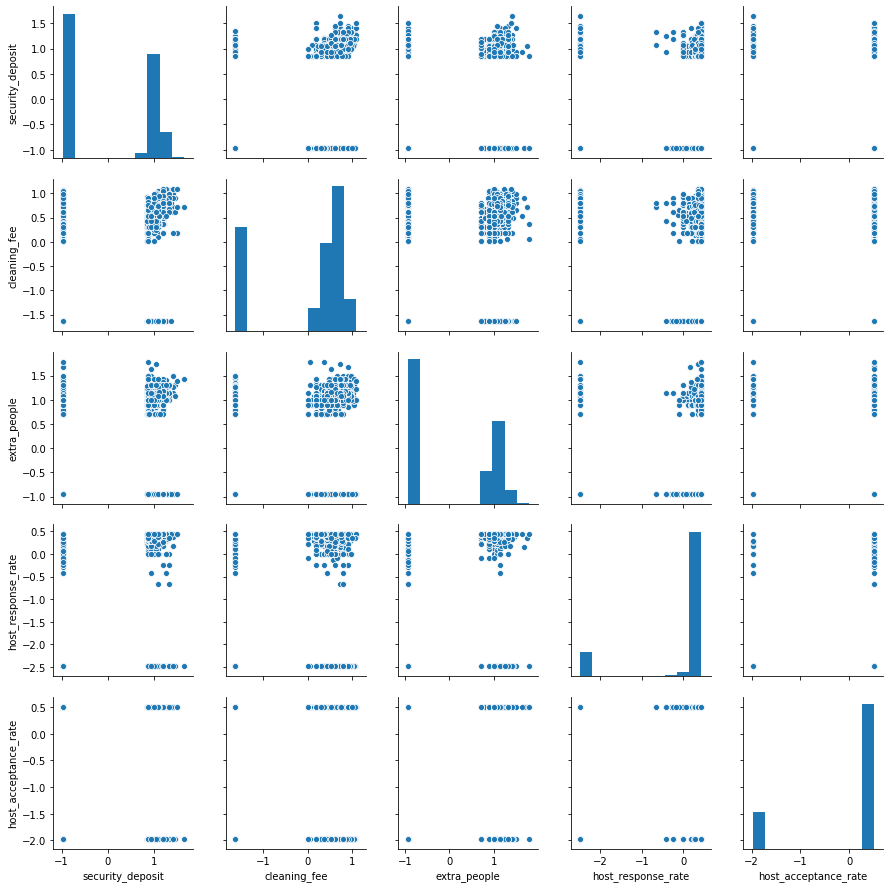

In [588]:
sns.pairplot(scaled_X_train[monetary+rate_columns])

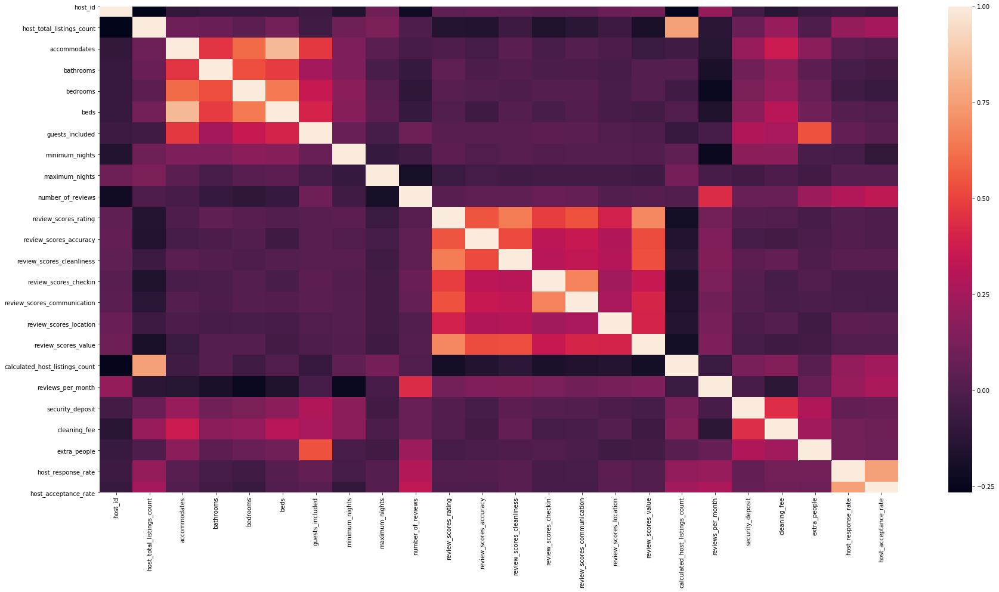

In [589]:
fig = plt.figure(figsize=(30,15))
ax = fig.gca()
sns.heatmap(scaled_X_train[numeric_columns+monetary+rate_columns].corr(), ax=ax)

In [590]:
X_test = X_test.fillna(X_test.mean())

X_test[numeric_columns+monetary+rate_columns] = X_test[numeric_columns+monetary+rate_columns].apply(lambda val: np.log(val+1))

scaled_X_test = pd.DataFrame(scaler.transform(X_test))
scaled_X_test.columns = X_test.columns

In [591]:
scaled_X_train.shape

(2558, 124)

In [608]:
def fit_predict_and_calc_r2(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_preds = model.predict(X_test)
    print(r2_score(y_test, y_preds))

In [618]:
model = SVR(kernel='rbf', C=1.5, epsilon=0.2)
fit_predict_and_calc_r2(model, scaled_X_train, y_train, scaled_X_test, y_test)

-0.09601891376902438


In [619]:
model = RandomForestRegressor(n_estimators=310, max_depth=20, random_state=43)
fit_predict_and_calc_r2(model, scaled_X_train, y_train, scaled_X_test, y_test)

0.6347397531508728


In [620]:
model = ExtraTreesRegressor(n_estimators=100, random_state=37)
fit_predict_and_calc_r2(model, scaled_X_train, y_train, scaled_X_test, y_test)

0.5946822621048169


In [621]:
model = RandomForestRegressor(n_estimators=310, max_depth=20, random_state=43)
fit_predict_and_calc_r2(model, scaled_X_train, y_train, scaled_X_test, y_test)
imps = pd.DataFrame()
imps['features'] = X_train.columns
imps['coefficients'] = model.feature_importances_
imps = imps.sort_values('coefficients', ascending=False)
imps.head(n=10)

0.6347397531508728


,features,coefficients
12,bedrooms,0.387329
15,cleaning_fee,0.049692
11,bathrooms,0.045103
10,accommodates,0.043270
116,Private room,0.030896
80,description_polarity,0.028932
7,latitude,0.025956
38,time_since_last_review,0.022395
23,availability_365,0.021425
36,reviews_per_month,0.020724


In [624]:
import statsmodels.api as sm
import statsmodels.formula.api as smf 
print ("OLS regression model for the association between price and features")
# reg1 is the model name , followed by equal sign. 
X = sm.add_constant(X_train)
reg1 = smf.OLS(y_train,X).fit()

# print the result
print (reg1.summary())

OLS regression model for the association between price and features
                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.593
Model:                            OLS   Adj. R-squared:                  0.573
Method:                 Least Squares   F-statistic:                     29.12
Date:                Sun, 22 Sep 2019   Prob (F-statistic):               0.00
Time:                        18:33:44   Log-Likelihood:                -25722.
No. Observations:                2558   AIC:                         5.169e+04
Df Residuals:                    2435   BIC:                         5.241e+04
Df Model:                         122                                         
Covariance Type:            nonrobust                                         
                                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------